## PROJECT SUMMARY:Employee Performance Analysis

* ## BUISNESSCASE & GOAL OF PROJECT:
* ### based on given feature of dataset we need to predict the performance rating of employee

## employee performance

INX Future Inc Employee Performance - Project INX Future Inc , (referred as INX ) , is one of the leading data analytics and automation solutions provider with over 15 years of global business presence. INX is consistently rated as top 20 best employers past 5 years. INX human resource policies are considered as employee friendly and widely perceived as best practices in the industry. Recent years, the employee performance indexes are not healthy and this is becoming a growing concerns among the top management. There has been increased escalations on service delivery and client satisfaction levels came down by 8 percentage points. CEO, Mr. Brain, knows the issues but concerned to take any actions in penalizing non-performing employees as this would affect the employee morale of all the employees in general and may further reduce the performance. Also, the market perception best employer and thereby attracting best talents to join the company. Mr. Brain decided to initiate a data science project , which analyses the current employee data and find the core underlying causes of this performance issues. Mr. Brain, being a data scientist himself, expects the findings of this project will help him to take right course of actions. He also expects a clear indicators of non performing employees, so that any penalization of non-performing employee, if required, may not significantly affect other employee morals. The following insights are expected from this project.

* 1.Department wise performances.
* 2.Top 3 Important Factors effecting employee performance
* 3.A trained model which can predict the employee performance based on factors
* 4.as inputs. This will be used to hire employees
* 5.Recommendations to improve the employee performance based on insights from analysis.

* ## Importing Modules Library

In [1]:
# 'Numpy' is used for mathematical operations on large, multi-dimensional arrays and matrices
import numpy as np

# 'Pandas' is used for data manipulation and analysis
import pandas as pd

# 'Seaborn' is based on matplotlib; used for plotting statistical graphics
import seaborn as sns

# 'Matplotlib' is a data visualization library for 2D and 3D plots, built on numpy
import matplotlib.pyplot as plt
%matplotlib inline 


# suppress display of warnings
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

* ## Loading the Dataset :

In [2]:
data=pd.read_excel("INX_Future_Inc_Employee_Performance_CDS_Project2_Data.xls")

In [3]:
data.head(pd.set_option("display.max_columns",None))

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,73,2,5,4,3,No,15,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,84,3,2,1,8,No,14,4,10,1,3,2,2,2,2,No,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,4,71,4,2,4,1,Yes,20,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,4,80,4,1,4,3,No,17,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,4,74,4,1,3,1,Yes,11,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,4,46,2,3,2,1,No,14,2,9,3,4,8,7,7,7,No,3


* ## Basic check Data

In [4]:
data.tail()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,4,71,4,2,4,1,Yes,20,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,4,80,4,1,4,3,No,17,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,4,74,4,1,3,1,Yes,11,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,4,46,2,3,2,1,No,14,2,9,3,4,8,7,7,7,No,3
1199,E100998,24,Female,Life Sciences,Single,Sales,Sales Executive,Travel_Rarely,3,2,1,65,3,2,3,9,No,14,1,4,3,3,2,2,2,0,Yes,2


In [5]:
data.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

* ## Statistical measure of data

In [6]:
# Returns basic statistics on numeric columns
data.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [7]:
data.describe(include="O")

,EmpNumber,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
count,1200,1200,1200,1200,1200,1200,1200,1200,1200
unique,1200,2,6,3,6,19,3,2,2
top,E1001000,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Rarely,No,No
freq,1,725,492,548,373,270,846,847,1022


In [8]:
data.shape

(1200, 28)

* ## Examine the data

In [9]:
# Returns basic information on all columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

# 2.Exploratory Data Analysis (EDA):

* ## Data Visualization :
* ### 1.Univariate analysis

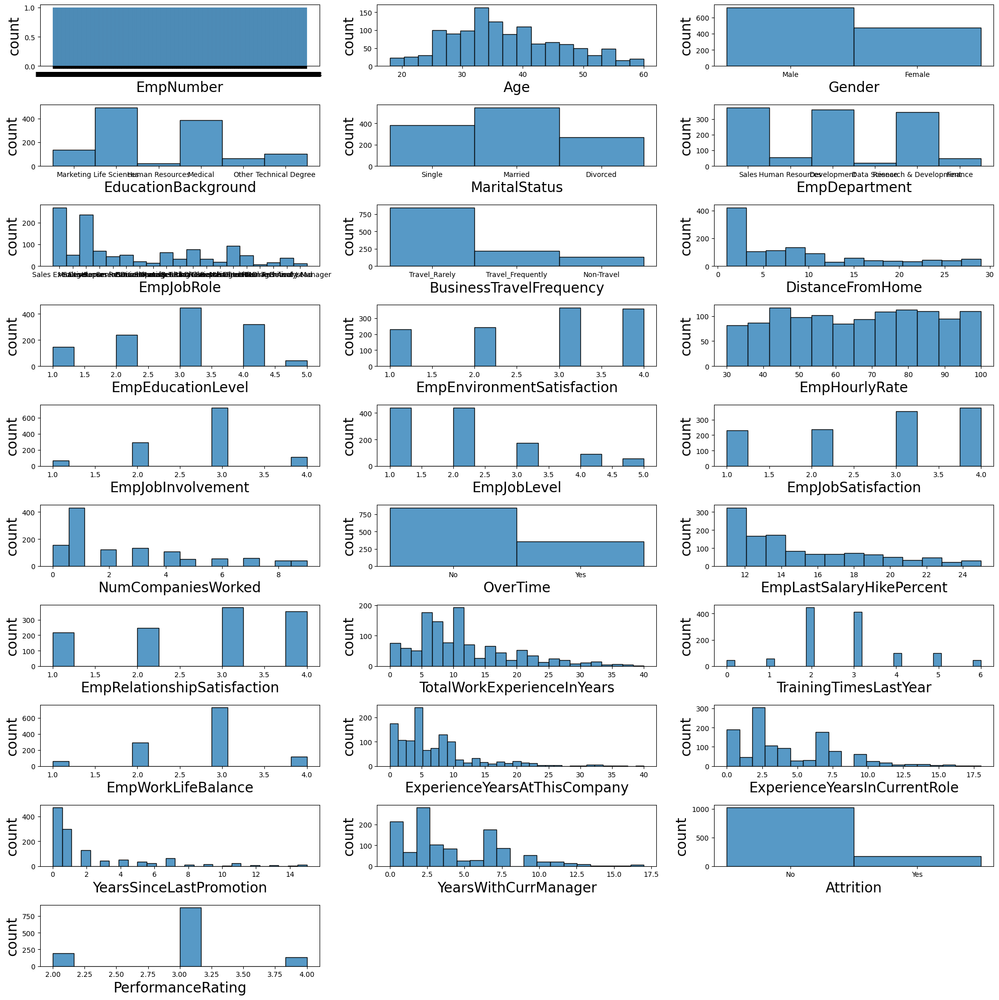

In [14]:
plt.figure(figsize=(20,20),facecolor="white")
plotnumber=1
for column in data:
    if plotnumber<=28:
        ax=plt.subplot(10,3,plotnumber)
        sns.histplot(x=data[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

* ## Insides :
* 1.Age- moustly employee age is lie between 25 to 40.
* 2.Gender - Male employee is more than Female employee.
* 3.EducationBackground - majority EducationBackground of employee is Data science and medical.
* 4.MaritalStatus - number of married employee is more.
* 5.EmpDepartment - count of this deparment Sales,Development,Research & Development is more than 340, other are lower than 50.
* 6.BusinessTravelFrequency- employee are travel rarely.
* 7.EmpLastSalaryHikePercent-Employee Last Salary Hike Percent is constantly decrese.
* 8.ExperienceYearsAtThisCompany- experience employee are left the company.
* 9.ExperienceYearsInCurrentRole - Year of Experience(majority) in current role is is less than 7.5 year.

In [5]:
#  Sweetviz automates interactive reports with visualizations and stats, helping quickly understand data distributions, correlations,
#  and dataset comparisons.
import sweetviz as sv
my_report=sv.analyze(data)
my_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## 2.Bivariate Analysis

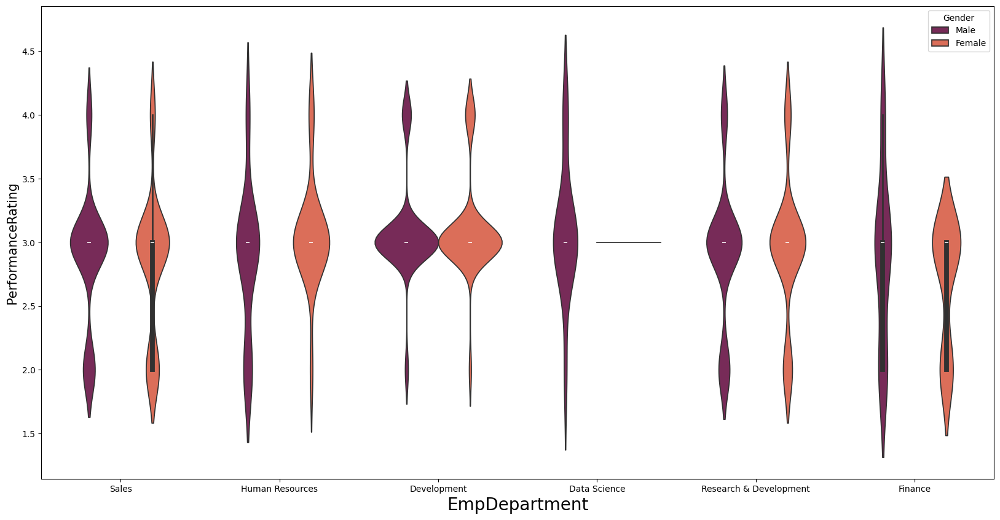

In [19]:
plt.figure(figsize=(20,10),facecolor='white')
sns.violinplot(x='EmpDepartment',y='PerformanceRating',hue=data.Gender,data=data,palette='rocket')
plt.xlabel('EmpDepartment',fontsize=20)
plt.ylabel('PerformanceRating',fontsize=15)
plt.show()

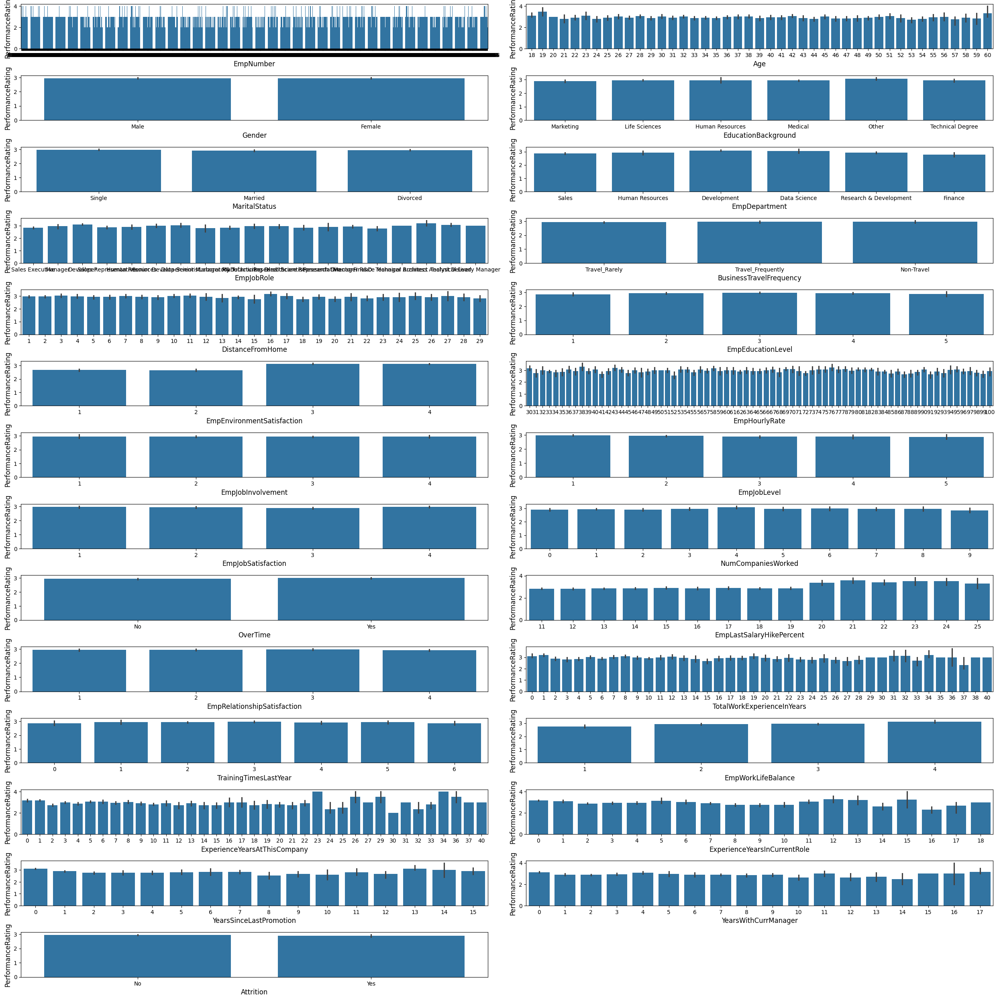

In [17]:
# Initialize plot
plt.figure(figsize=(25, 25), facecolor="white")
plotnumber = 1
target_column="PerformanceRating"
for column in data.columns:
    if column !=target_column:
        #create a subplot
        if plotnumber<=28:
            ax=plt.subplot(14,2,plotnumber)
             # Plot correlation (e.g., using sns.barplot to visualize the relationship)
            sns.barplot(x=data[column], y=data[target_column], ax=ax)
            ax.set_xlabel(column, fontsize=12)
            ax.set_ylabel(target_column, fontsize=12)
        plotnumber+=1

# Adjust layout
plt.tight_layout()
plt.show()

In [6]:
#biveriate analysis
#autoviz
from autoviz.AutoViz_Class import AutoViz_Class
AV=AutoViz_Class()
filename=data
dft=AV.AutoViz(
    filename
)

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (1200, 28)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  19
    Number of String-Categorical Columns =  5
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  3
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number o

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
EmpNumber,object,0.000000,100,,,Possible ID column: drop before modeling step.
Age,int64,0.000000,3,18.000000,60.000000,No issue
Gender,object,0.000000,0,,,No issue
EducationBackground,object,0.000000,0,,,No issue
MaritalStatus,object,0.000000,0,,,No issue
EmpDepartment,object,0.000000,0,,,No issue
EmpJobRole,object,0.000000,1,,,1 rare categories: ['Technical Architect']. Group them into a single category or drop the categories.
BusinessTravelFrequency,object,0.000000,0,,,No issue
DistanceFromHome,int64,0.000000,2,1.000000,29.000000,No issue
EmpEducationLevel,int64,0.000000,0,1.000000,5.000000,No issue


Number of All Scatter Plots = 190
All Plots done
Time to run AutoViz = 33 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


### ProfileReport

In [18]:
from ydata_profiling import ProfileReport
profile=ProfileReport(data,title="EDA",explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3.Data Preprocessing

### 1.Data Cleaning

In [4]:
data.isnull().sum()

EmpNumber                       0
Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

* #### there is no null value present in data

## 2.Encoding categorical varible

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

In [4]:
# Encoding all the ordinal columns and creating a dummy variable for them to see if there are any effects on Performance Rating
from sklearn.preprocessing import LabelEncoder
Lc=LabelEncoder()

In [5]:

def label_encode(data):
    """
    Function to apply label encoding to all categorical columns in a dataframe.
    
    Parameters:
    df (pd.DataFrame): Input dataframe with categorical columns.
    
    Returns:
    pd.DataFrame: Dataframe with label encoded columns.
    """
    # Initialize the LabelEncoder
    label_encoder = LabelEncoder()
    
    # Iterate through each column
    for column in data.select_dtypes(include=['object']).columns:
        data[column] = label_encoder.fit_transform(data[column])
    
    return data

# Example usage:
# Assuming df is a DataFrame with some categorical data

data = pd.DataFrame(data)

# Apply label encoding to the dataframe
encoded_df = label_encode(data)

print(encoded_df)
data=encoded_df

      EmpNumber  Age  Gender  EducationBackground  MaritalStatus  \
0             0   32       1                    2              2   
1             1   47       1                    2              2   
2             2   40       1                    1              1   
3             3   41       1                    0              0   
4             4   60       1                    2              2   
...         ...  ...     ...                  ...            ...   
1195       1195   27       0                    3              0   
1196       1196   37       1                    1              2   
1197       1197   50       1                    3              1   
1198       1198   34       0                    3              2   
1199       1199   24       0                    1              2   

      EmpDepartment  EmpJobRole  BusinessTravelFrequency  DistanceFromHome  \
0                 5          13                        2                10   
1                 5        

## 3.Remove or Handle Outliers

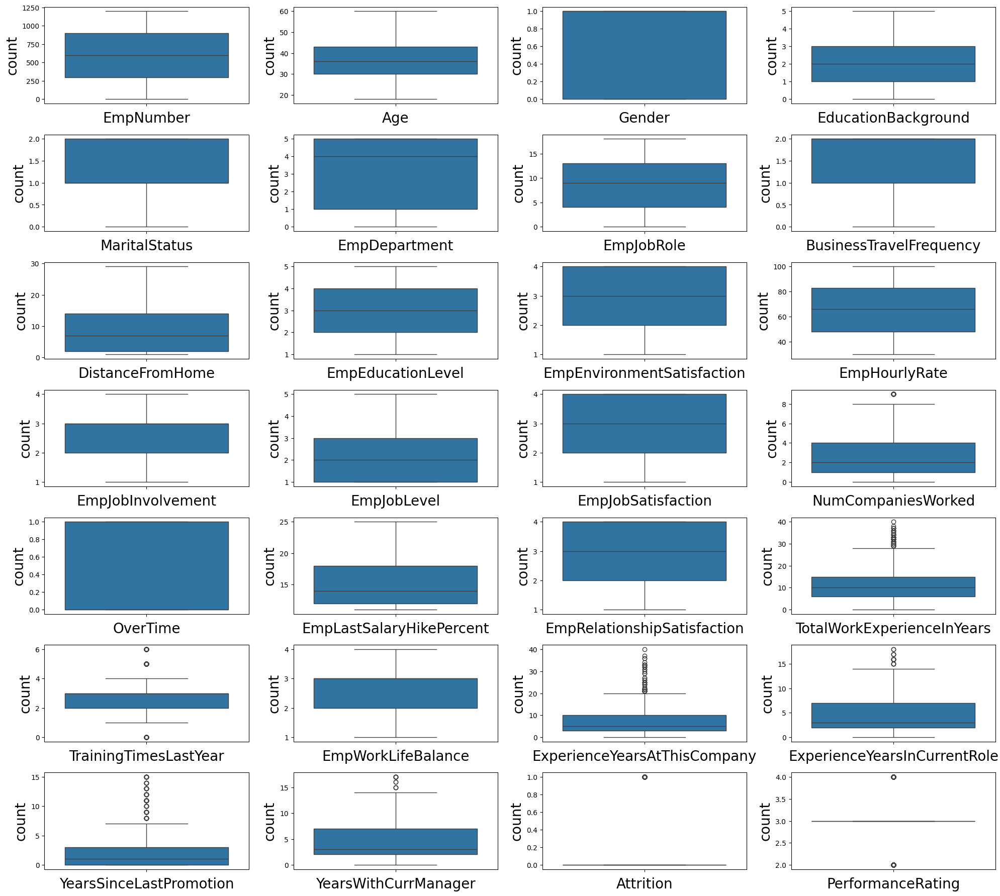

In [6]:
plt.figure(figsize=(20,20),facecolor="white")
plotnumber=1
for column in data:
    if plotnumber<=32:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(data[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [7]:
# Drop the last two columns beacuse contain atleast two class for modeling

d1=['Attrition','PerformanceRating']
data1=data.drop(d1,axis=1)

In [8]:
# remove outlier
#outlier handling for M_acid and its not a normal so we use IQR range
from scipy import stats#import stats to calculat mod


In [9]:

def handle_outliers(data1, method='replace'):
    """
    Function to handle outliers in a dataset.
    Parameters:
    df (pd.DataFrame): Input dataframe with numerical columns.
    method (str): The method to handle outliers: 'remove', 'cap', 'replace'.
                  - 'remove': Removes rows with outliers.
                  - 'cap': Caps outliers to the threshold values.
                  - 'replace': Replaces outliers with the median value.
    Returns:
    pd.DataFrame: The dataframe after handling the outliers.
    """
    df_copy=data1
    # Calculate Q1, Q3, and IQR for each numerical column
    Q1 = df_copy.quantile(0.25)
    Q3 = df_copy.quantile(0.75)
    IQR = Q3 - Q1
    
    # Define lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identify outliers based on the bounds
    outliers = ((df_copy < lower_bound) | (df_copy > upper_bound))
    
    # Handle outliers based on the chosen method
    if method == 'replace':
        # Replace outliers with the median of the column
        for column in df_copy.select_dtypes(include=[np.number]).columns:
            median = df_copy[column].median()
            df_copy[column] = np.where(outliers[column], median, df_copy[column])
    
    return df_copy

In [10]:
#function call handle_outliers
data1=handle_outliers(data1, method='replace')
data1

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.0,32.0,1.0,2.0,2.0,5.0,13.0,2.0,10.0,3.0,4.0,55.0,3.0,2.0,4.0,1.0,0.0,12.0,4.0,10.0,2.0,2.0,10.0,7.0,0.0,8.0
1,1.0,47.0,1.0,2.0,2.0,5.0,13.0,2.0,14.0,4.0,4.0,42.0,3.0,2.0,1.0,2.0,0.0,12.0,4.0,20.0,2.0,3.0,7.0,7.0,1.0,7.0
2,2.0,40.0,1.0,1.0,1.0,5.0,13.0,1.0,5.0,4.0,4.0,48.0,2.0,3.0,1.0,5.0,1.0,21.0,3.0,20.0,2.0,3.0,18.0,13.0,1.0,12.0
3,3.0,41.0,1.0,0.0,0.0,3.0,8.0,2.0,10.0,4.0,2.0,73.0,2.0,5.0,4.0,3.0,0.0,15.0,2.0,23.0,2.0,2.0,5.0,6.0,1.0,6.0
4,4.0,60.0,1.0,2.0,2.0,5.0,13.0,2.0,16.0,4.0,1.0,84.0,3.0,2.0,1.0,8.0,0.0,14.0,4.0,10.0,1.0,3.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,1195.0,27.0,0.0,3.0,0.0,5.0,13.0,1.0,3.0,1.0,4.0,71.0,4.0,2.0,4.0,1.0,1.0,20.0,2.0,6.0,3.0,3.0,6.0,5.0,0.0,4.0
1196,1196.0,37.0,1.0,1.0,2.0,1.0,15.0,2.0,10.0,2.0,4.0,80.0,4.0,1.0,4.0,3.0,0.0,17.0,1.0,4.0,2.0,3.0,1.0,0.0,0.0,0.0
1197,1197.0,50.0,1.0,3.0,1.0,1.0,15.0,2.0,28.0,1.0,4.0,74.0,4.0,1.0,3.0,1.0,1.0,11.0,3.0,20.0,3.0,3.0,20.0,8.0,3.0,8.0
1198,1198.0,34.0,0.0,3.0,2.0,0.0,1.0,2.0,9.0,3.0,4.0,46.0,2.0,3.0,2.0,1.0,0.0,14.0,2.0,9.0,3.0,4.0,8.0,7.0,7.0,7.0


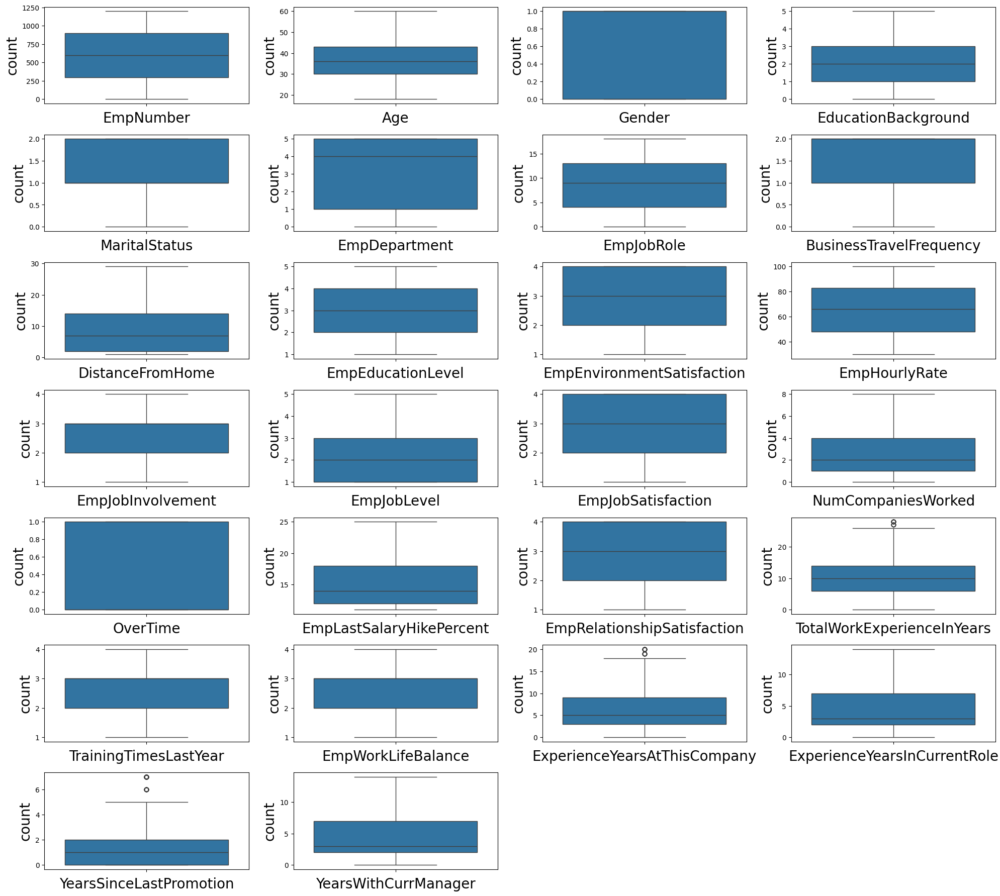

In [11]:
plt.figure(figsize=(20,20),facecolor="white")
plotnumber=1
for column in data1:
    if plotnumber<=32:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(data1[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [12]:

con_data=data[['Attrition','PerformanceRating']]
con_data

,Attrition,PerformanceRating
0,0,3
1,0,3
2,0,4
3,0,3
4,0,3
...,...,...
1195,0,4
1196,0,3
1197,0,3
1198,0,3


In [13]:
# Concatenate along columns (axis=1)

data=pd.concat([data1,con_data],axis=1)
data

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,0.0,32.0,1.0,2.0,2.0,5.0,13.0,2.0,10.0,3.0,4.0,55.0,3.0,2.0,4.0,1.0,0.0,12.0,4.0,10.0,2.0,2.0,10.0,7.0,0.0,8.0,0,3
1,1.0,47.0,1.0,2.0,2.0,5.0,13.0,2.0,14.0,4.0,4.0,42.0,3.0,2.0,1.0,2.0,0.0,12.0,4.0,20.0,2.0,3.0,7.0,7.0,1.0,7.0,0,3
2,2.0,40.0,1.0,1.0,1.0,5.0,13.0,1.0,5.0,4.0,4.0,48.0,2.0,3.0,1.0,5.0,1.0,21.0,3.0,20.0,2.0,3.0,18.0,13.0,1.0,12.0,0,4
3,3.0,41.0,1.0,0.0,0.0,3.0,8.0,2.0,10.0,4.0,2.0,73.0,2.0,5.0,4.0,3.0,0.0,15.0,2.0,23.0,2.0,2.0,5.0,6.0,1.0,6.0,0,3
4,4.0,60.0,1.0,2.0,2.0,5.0,13.0,2.0,16.0,4.0,1.0,84.0,3.0,2.0,1.0,8.0,0.0,14.0,4.0,10.0,1.0,3.0,2.0,2.0,2.0,2.0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,1195.0,27.0,0.0,3.0,0.0,5.0,13.0,1.0,3.0,1.0,4.0,71.0,4.0,2.0,4.0,1.0,1.0,20.0,2.0,6.0,3.0,3.0,6.0,5.0,0.0,4.0,0,4
1196,1196.0,37.0,1.0,1.0,2.0,1.0,15.0,2.0,10.0,2.0,4.0,80.0,4.0,1.0,4.0,3.0,0.0,17.0,1.0,4.0,2.0,3.0,1.0,0.0,0.0,0.0,0,3
1197,1197.0,50.0,1.0,3.0,1.0,1.0,15.0,2.0,28.0,1.0,4.0,74.0,4.0,1.0,3.0,1.0,1.0,11.0,3.0,20.0,3.0,3.0,20.0,8.0,3.0,8.0,0,3
1198,1198.0,34.0,0.0,3.0,2.0,0.0,1.0,2.0,9.0,3.0,4.0,46.0,2.0,3.0,2.0,1.0,0.0,14.0,2.0,9.0,3.0,4.0,8.0,7.0,7.0,7.0,0,3


# 4.Feature selection

### a.remove unwanted columns

In [14]:
data.head(1)

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,0.0,32.0,1.0,2.0,2.0,5.0,13.0,2.0,10.0,3.0,4.0,55.0,3.0,2.0,4.0,1.0,0.0,12.0,4.0,10.0,2.0,2.0,10.0,7.0,0.0,8.0,0,3


In [15]:
#remove EMPNumber columns
data.drop(['EmpNumber'],axis=1,inplace=True)

### b.checking correlation

In [16]:
data.corr()

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
Age,1.000000,-0.040107,-0.055905,-0.098368,-0.000104,-0.037665,0.040579,0.020937,0.207313,0.013814,0.062867,0.027216,0.509139,-0.002436,0.300805,0.051910,-0.006105,0.049749,0.559662,0.025680,-0.019563,0.176752,0.185951,0.121078,0.187042,-0.189317,-0.040164
Gender,-0.040107,1.000000,0.009922,-0.042169,-0.010925,0.011332,-0.043608,-0.001507,-0.022960,0.000033,0.002218,0.010949,-0.050685,0.024680,-0.043927,-0.038410,-0.005319,0.030707,-0.060534,-0.033224,0.015793,-0.053683,-0.023985,-0.028153,-0.039737,0.035758,-0.001780
EducationBackground,-0.055905,0.009922,1.000000,-0.001097,-0.026874,-0.012325,0.012382,-0.013919,-0.047978,0.045028,-0.030234,-0.025505,-0.056338,-0.030977,-0.016459,0.007046,-0.009788,0.005652,-0.016705,0.019820,0.022890,0.006914,0.007309,0.008085,0.001657,0.027161,0.005607
MaritalStatus,-0.098368,-0.042169,-0.001097,1.000000,0.067272,0.038023,0.028520,-0.019148,0.026737,-0.032467,-0.013540,-0.043355,-0.087359,0.044593,-0.034923,-0.022833,0.010128,0.026410,-0.096627,0.000601,0.014154,-0.047122,-0.067115,-0.013159,-0.065892,0.162969,0.024172
EmpDepartment,-0.000104,-0.010925,-0.026874,0.067272,1.000000,0.568973,-0.045233,0.007707,0.019175,-0.019237,0.003957,-0.076988,0.100526,0.007150,0.004761,-0.026841,-0.012661,-0.050286,0.011727,0.038269,0.068875,0.069587,0.068314,0.054917,0.047389,0.048006,-0.162615
EmpJobRole,-0.037665,0.011332,-0.012325,0.038023,0.568973,1.000000,-0.086251,0.022939,-0.016792,0.044612,-0.016179,-0.008034,0.004406,0.032916,0.006310,0.015075,0.005735,-0.043067,-0.017979,0.008986,-0.007519,0.041822,0.034071,0.036698,0.017096,0.037508,-0.096209
BusinessTravelFrequency,0.040579,-0.043608,0.012382,0.028520,-0.045233,-0.086251,1.000000,-0.020935,0.002064,0.012267,0.025400,0.016652,0.036360,-0.031236,0.040895,0.032229,-0.041946,-0.032705,0.032795,0.014170,-0.040969,-0.017051,-0.010188,0.022616,-0.051463,0.007217,-0.031025
DistanceFromHome,0.020937,-0.001507,-0.013919,-0.019148,0.007707,0.022939,-0.020935,1.000000,0.045856,-0.017719,0.013730,0.003231,0.017270,-0.003036,-0.005756,0.024940,0.044974,-0.009509,0.035134,-0.041665,-0.044788,0.044539,0.025994,0.027552,0.014473,0.063248,-0.046142
EmpEducationLevel,0.207313,-0.022960,-0.047978,0.026737,0.019175,-0.016792,0.002064,0.045856,1.000000,-0.037103,0.014095,0.027544,0.100734,0.000357,0.122143,-0.021119,0.002358,-0.016690,0.119202,-0.004939,0.010276,0.073043,0.069838,0.041243,0.073803,-0.049118,0.020529
EmpEnvironmentSatisfaction,0.013814,0.000033,0.045028,-0.032467,-0.019237,0.044612,0.012267,-0.017719,-0.037103,1.000000,-0.049501,0.004865,-0.008272,-0.004319,0.007080,0.064270,-0.047271,-0.010504,-0.042040,0.027839,-0.000262,0.006995,0.047522,0.012837,-0.007706,-0.123490,0.395561


<Axes: >

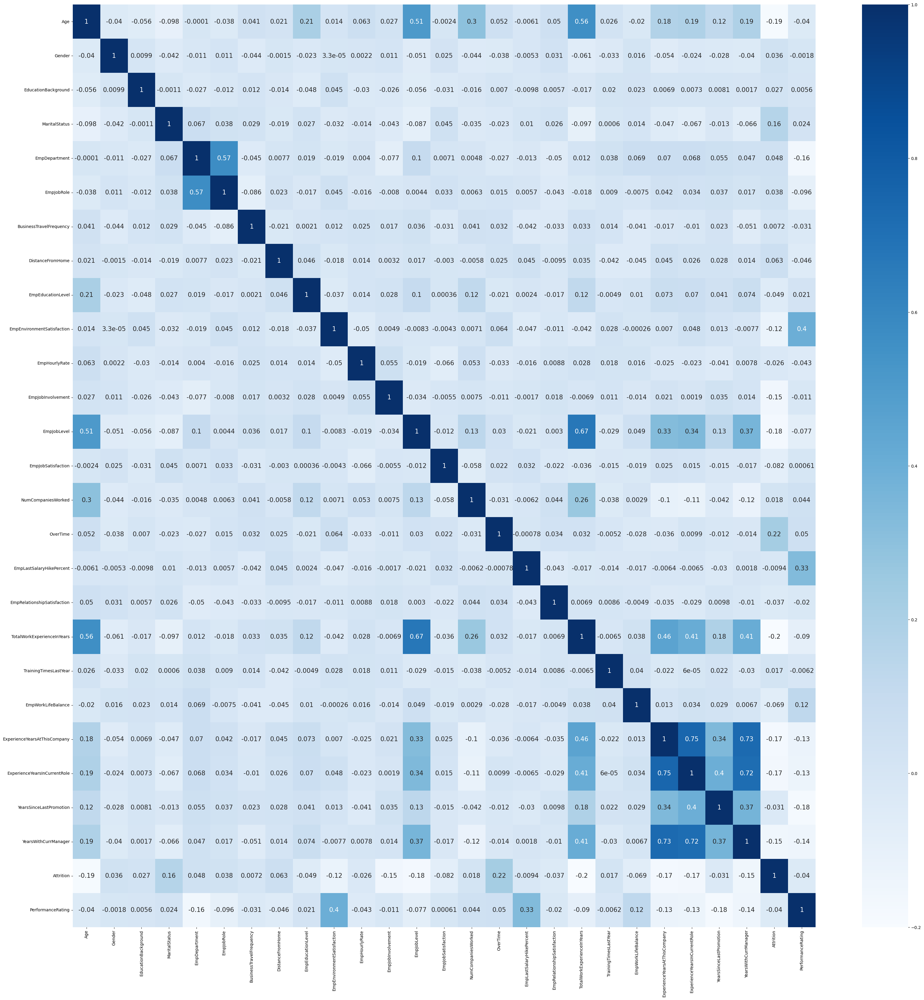

In [17]:
# checking heat map again
plt.figure(figsize=(40,40))
sns.heatmap(data.corr(),annot=True,annot_kws={'size':15},cmap='Blues')

There are a lot of columns in the predictor variable. So, the correlation coeffecient is calculated to see which of them are important and these are then used for training methods. From there, we also get the top factors which affect performance. We can see that the most important features selectd were Department, Job Role, Environment Satisfaction, Last Salary Hike Percent, Work Life Balance, Experience Years At This Company, Experience Years In Current Role, Years Since Last Promotion, Years With Current Manager. These were selected because their correlation coeffecient with Performance Rating was more than 0.1. Standardization and Label Encoding was also used for feature transformation.

A separate analysis considering all the predictors was carried out but it resulted in decreasing the accuracy. Similarly, Principal Component Analysis also reduces the accuracy. Top 3 factors which affect the employee performance are-

* Employee EnvironmentSatisfaction
* Employee Last Salary Hike Percent
* Years Since Last Promotion

## Feature Scaling

In [18]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
scaled_features=sc.fit_transform(data[['Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition']])

#add the scaled featured to the dataframe
data[['Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition']]=scaled_features

## Model creation

In [20]:
#creating independent and depent varible
x=data.drop(['PerformanceRating'],axis=1)
y=data['PerformanceRating']
from sklearn.model_selection import train_test_split
#split the data into training and testing sets
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [21]:
print(x_train.shape)
print(y_test.shape)
print(y_train.shape)
print(x_test.shape)

(960, 26)
(240,)
(960,)
(240, 26)


# 1.LogisticRegression

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,recall_score,precision_score,classification_report
LR=LogisticRegression()
LR.fit(x_train,y_train)
y_hat=LR.predict(x_test)
y_hat

array([3, 2, 3, 3, 3, 3, 2, 3, 3, 4, 3, 4, 3, 2, 3, 3, 3, 3, 4, 4, 2, 3,
       3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2, 3, 3, 3, 2, 3, 4, 3,
       3, 3, 3, 2, 2, 3, 2, 2, 3, 3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 3,
       2, 4, 3, 3, 2, 3, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 4, 3, 3, 3, 3, 3,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 3, 3, 3, 4, 3, 3, 4, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 4, 2, 3, 3, 3, 2, 3, 3, 4, 3, 2, 3, 4, 3, 3, 3, 2, 3, 3,
       2, 3, 3, 3, 3, 3, 2, 3, 3, 2, 3, 3, 3, 3, 3, 2, 3, 4, 2, 3, 3, 3,
       3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 4, 3, 3, 3, 2, 3, 3, 3, 4, 4, 3, 3, 3, 3, 3],
      dtype=int64)

In [23]:
ac_score=accuracy_score(y_test,y_hat)
print('accuracy score :',ac_score)

recall=recall_score(y_test,y_hat,average='weighted')
print('recall score :',recall)

precision = precision_score(y_test,y_hat,average='weighted')
print('precision score :',precision)

f1=f1_score(y_test,y_hat,average='weighted')
print('f1 score :',f1)

accuracy score : 0.8416666666666667
recall score : 0.8416666666666667
precision score : 0.8441949140359956
f1 score : 0.8418959911008429


# 2.support vector machine

In [24]:
from sklearn.svm import SVC
svclassifier=SVC()
svclassifier.fit(x_train,y_train)
y_pred=svclassifier.predict(x_test)
y_pred

array([3, 3, 3, 3, 3, 3, 2, 3, 3, 4, 3, 4, 3, 3, 3, 3, 3, 3, 4, 2, 2, 3,
       3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 2, 3, 4, 3,
       3, 3, 3, 2, 3, 3, 2, 2, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3,
       3, 4, 3, 3, 2, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 3, 3, 2, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3, 4, 3, 3, 3, 3, 3, 3,
       2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3,
       3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 4, 3, 3, 3, 2, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3],
      dtype=int64)

In [25]:
accuracy=accuracy_score(y_test,y_pred)
print('accuracy_score :',accuracy)

precision=precision_score(y_test,y_pred,average='weighted')
print('precision score :',precision)

recall=recall_score(y_test,y_pred,average='weighted')
print('recall score :',recall)

f1=f1_score(y_test,y_pred,average='weighted')
print('f1_score :',f1)

accuracy_score : 0.8458333333333333
precision score : 0.8455129694154084
recall score : 0.8458333333333333
f1_score : 0.8334072460133342


In [26]:
cm_matrix=confusion_matrix(y_test,y_pred)
cm_matrix

array([[ 13,  16,   0],
       [  8, 176,   0],
       [  0,  13,  14]], dtype=int64)

In [27]:
cr=classification_report(y_test,y_pred)
print(cr)

              precision    recall  f1-score   support

           2       0.62      0.45      0.52        29
           3       0.86      0.96      0.90       184
           4       1.00      0.52      0.68        27

    accuracy                           0.85       240
   macro avg       0.83      0.64      0.70       240
weighted avg       0.85      0.85      0.83       240



## 3.PCA(Principal component analysis)

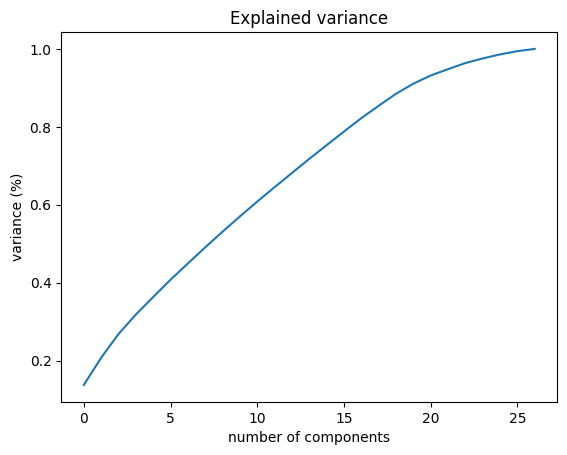

In [29]:
# getting the optimal number of pca
from sklearn.decomposition import PCA
pca=PCA()
principalcomponents = pca.fit_transform(data)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('variance (%)')#for each component
plt.title('Explained variance')
plt.show()

In [30]:
pca = PCA(n_components=5)
new_data = pca.fit_transform(data)
# This will be the new data fed to the algorithm.
principal_Df = pd.DataFrame(data = new_data,columns = ['PC1','PC2','PC3','PC4','PC5'])
principal_Df.head()

,PC1,PC2,PC3,PC4,PC5
0,0.841862,-1.639711,0.295145,-0.678157,0.081754
1,1.823740,0.086452,1.094711,-0.306153,0.502247
2,4.348876,-0.870673,0.967727,0.446817,0.578196
3,2.439414,1.838247,0.479287,-0.044978,-1.495743
4,0.124072,2.686928,2.497807,0.079524,-1.946329


In [31]:
con_data=data['PerformanceRating']
con_data
final_data=pd.concat([principal_Df,con_data],axis=1)
final_data

,PC1,PC2,PC3,PC4,PC5,PerformanceRating
0,0.841862,-1.639711,0.295145,-0.678157,0.081754,3
1,1.823740,0.086452,1.094711,-0.306153,0.502247,3
2,4.348876,-0.870673,0.967727,0.446817,0.578196,4
3,2.439414,1.838247,0.479287,-0.044978,-1.495743,3
4,0.124072,2.686928,2.497807,0.079524,-1.946329,3
...,...,...,...,...,...,...
1195,-0.646117,-1.515375,0.072536,-1.633317,1.720485,4
1196,-2.510991,0.426963,-0.029303,-1.742757,-0.606602,3
1197,3.026412,-1.155740,-1.206383,0.285163,1.325658,3
1198,1.652535,-0.727037,-2.524118,0.767591,1.457738,3


In [32]:
x=final_data.iloc[:,:-1]
y=final_data.PerformanceRating

In [33]:
## Step 2 Creating training and testing data.
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=42)
## Step 3 Model creation
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train,y_train)  ## training
## Step 4 Prediction
y_pred=clf.predict(x_test)

In [34]:
accuracy=accuracy_score(y_test,y_pred)
print('accuracy_score :',accuracy)

precision=precision_score(y_test,y_pred,average='weighted')
print('precision score :',precision)

recall=recall_score(y_test,y_pred,average='weighted')
print('recall score :',recall)

f1=f1_score(y_test,y_pred,average='weighted')
print('f1_score :',f1)

conf_matrix = confusion_matrix(y_test,y_pred)
conf_matrix

accuracy_score : 0.7733333333333333
precision score : 0.6797490164156831
recall score : 0.7733333333333333
f1_score : 0.7208368399339934


array([[ 13,  24,   0],
       [ 13, 219,   0],
       [  1,  30,   0]], dtype=int64)

# 4.Decision tree

In [28]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
y_pred1=dtc.predict(x_test)
y_pred1

array([3, 2, 3, 3, 3, 3, 2, 3, 2, 3, 4, 4, 4, 3, 2, 2, 3, 3, 4, 2, 2, 3,
       3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3, 2, 3, 4, 3,
       3, 3, 3, 3, 3, 3, 2, 4, 3, 3, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 2,
       3, 4, 3, 3, 2, 3, 4, 4, 3, 2, 3, 3, 3, 4, 3, 3, 3, 3, 4, 3, 4, 3,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 4, 4, 3, 3, 3, 2,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 2, 3,
       3, 3, 3, 3, 4, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3,
       4, 3, 3, 4, 3, 4, 3, 3, 2, 3, 3, 4, 3, 2, 3, 4, 3, 3, 3, 3, 3, 3,
       2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 2, 3, 3, 3,
       3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3,
       3, 2, 3, 3, 4, 4, 3, 3, 3, 2, 3, 3, 3, 4, 4, 3, 3, 3, 3, 3],
      dtype=int64)

In [29]:
accuracy=accuracy_score(y_test,y_pred1)
print('accuracy_score :',accuracy)

precision=precision_score(y_test,y_pred1,average='weighted')
print('precision score :',precision)

recall=recall_score(y_test,y_pred1,average='weighted')
print('recall score :',recall)

f1=f1_score(y_test,y_pred1,average='weighted')
print('f1_score :',f1)

conf_matrix = confusion_matrix(y_test,y_pred1)
conf_matrix

accuracy_score : 0.8791666666666667
precision score : 0.8833590587366651
recall score : 0.8791666666666667
f1_score : 0.8808153985972648


array([[ 22,   5,   2],
       [  6, 169,   9],
       [  0,   7,  20]], dtype=int64)

# 5.Random Forest

In [30]:
from sklearn.ensemble import RandomForestClassifier
RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
rfc_test=RFC.predict(x_test)
rfc_test

array([3, 2, 3, 3, 3, 3, 3, 3, 2, 3, 3, 4, 3, 3, 2, 2, 3, 3, 4, 2, 2, 3,
       3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 2, 3, 4, 3,
       3, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 3,
       3, 4, 3, 2, 2, 3, 4, 4, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 3, 3, 3, 2,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3,
       3, 3, 3, 3, 4, 3, 3, 2, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2,
       3, 3, 3, 4, 3, 4, 3, 3, 2, 3, 3, 4, 3, 2, 3, 4, 3, 3, 3, 3, 3, 3,
       2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3,
       4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 4, 3, 3, 3, 2, 3, 3, 3, 3, 4, 3, 3, 2, 3, 3],
      dtype=int64)

In [31]:
accuracy=accuracy_score(y_test,rfc_test)
print('accuracy_score :',accuracy)

precision=precision_score(y_test,rfc_test,average='weighted')
print('precision score :',precision)

recall=recall_score(y_test,rfc_test,average='weighted')
print('recall score :',recall)

f1=f1_score(y_test,rfc_test,average='weighted')
print('f1_score :',f1)

conf_matrix = confusion_matrix(y_test,rfc_test)
conf_matrix

accuracy_score : 0.9333333333333333
precision score : 0.9338779239766082
recall score : 0.9333333333333333
f1_score : 0.9313227146413756


array([[ 26,   3,   0],
       [  4, 179,   1],
       [  0,   8,  19]], dtype=int64)

## 6.Artificial Neural Network (ANN)

In [32]:
## model creation
from sklearn.neural_network import MLPClassifier
model = MLPClassifier( hidden_layer_sizes=(50,3),
                       learning_rate_init=0.01,
                       max_iter=100,
                       random_state=2) ## model object creation max_iter=Stopping parameter
model.fit(x_train,y_train) ## training the data
y_predict_proba = model.predict_proba(x_test) ## predicting the probability of class
y_predict = model.predict(x_test)
y_train_predict = model.predict(x_train)

In [33]:
## Evaluating the model created
from sklearn.metrics import accuracy_score,confusion_matrix
print("Train accuracy :",accuracy_score(y_train,y_train_predict))
print("Test accuracy :",accuracy_score(y_test,y_predict))

Train accuracy : 0.990625
Test accuracy : 0.8291666666666667


# 7.K-Nearest Neighbor

In [41]:
# Training the model
from sklearn.neighbors import KNeighborsClassifier
model_knn = KNeighborsClassifier(n_neighbors=10,metric='euclidean') # Maximum accuracy for n=10
model_knn.fit(x_train,y_train)
# Predicting the model
y_predict_knn = model_knn.predict(x_test)

In [42]:
accuracy=accuracy_score(y_test,y_predict_knn)
print('accuracy_score :',accuracy)

precision=precision_score(y_test,y_predict_knn,average='weighted')
print('precision score :',precision)

recall=recall_score(y_test,y_predict_knn,average='weighted')
print('recall score :',recall)

f1=f1_score(y_test,y_predict_knn,average='weighted')
print('f1_score :',f1)

conf_matrix = confusion_matrix(y_test,y_predict_knn)
conf_matrix

accuracy_score : 0.7875
precision score : 0.7750178498572011
recall score : 0.7875
f1_score : 0.75191802897395


array([[  9,  19,   1],
       [  9, 175,   0],
       [  1,  21,   5]], dtype=int64)

# hyper parameter tunning

## hyper parameter tunning for logistic regression

In [34]:
from sklearn.model_selection import RandomizedSearchCV
log=LogisticRegression()
params={'C':[0.1,1,2.5,10],'penalty':['l1','l2']}
rcv_log=RandomizedSearchCV(log,params,cv=5,random_state=25,scoring='accuracy')
rcv_log.fit(x_train,y_train)
rcv_log.best_params_

{'penalty': 'l2', 'C': 1}

In [35]:
log=LogisticRegression(C=1,penalty='l2')
log.fit(x_train,y_train)
y_pred = log.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           2       0.52      0.55      0.53        29
           3       0.89      0.91      0.90       184
           4       0.86      0.70      0.78        27

    accuracy                           0.84       240
   macro avg       0.76      0.72      0.74       240
weighted avg       0.84      0.84      0.84       240



## Hyper parameter tunning - random forest

In [36]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
model=RandomForestClassifier()
params_best = {'n_estimators':randint(10,100),'max_depth':[5,10,15,25,28,30,44],'min_samples_split':randint(2,15),'min_samples_leaf':randint(1,10)}
random_search = RandomizedSearchCV(model,params_best,n_iter=100,cv=5,random_state=40,verbose=2)
random_search.fit(x_train,y_train)
print('best parameters :',random_search.best_params_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END max_depth=44, min_samples_leaf=8, min_samples_split=7, n_estimators=66; total time=   0.1s
[CV] END max_depth=44, min_samples_leaf=8, min_samples_split=7, n_estimators=66; total time=   0.1s
[CV] END max_depth=44, min_samples_leaf=8, min_samples_split=7, n_estimators=66; total time=   0.1s
[CV] END max_depth=44, min_samples_leaf=8, min_samples_split=7, n_estimators=66; total time=   0.1s
[CV] END max_depth=44, min_samples_leaf=8, min_samples_split=7, n_estimators=66; total time=   0.1s
[CV] END max_depth=15, min_samples_leaf=2, min_samples_split=14, n_estimators=81; total time=   0.1s
[CV] END max_depth=15, min_samples_leaf=2, min_samples_split=14, n_estimators=81; total time=   0.1s
[CV] END max_depth=15, min_samples_leaf=2, min_samples_split=14, n_estimators=81; total time=   0.1s
[CV] END max_depth=15, min_samples_leaf=2, min_samples_split=14, n_estimators=81; total time=   0.1s
[CV] END max_depth=15, min_sample

In [37]:
rfc=RandomForestClassifier(
    max_depth=25,
    min_samples_leaf=1,
    min_samples_split=12,
    n_estimators=94,
    random_state=42    
)
rfc.fit(x_train,y_train)
y_predict=rfc.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of the Random Forest model: {accuracy * 100:.2f}%")

Accuracy of the Random Forest model: 84.17%


In [38]:
accuracy = random_search.score (x_test,y_test)
print('test accuracy : ',accuracy)

test accuracy :  0.9416666666666667


# Model Comparison report

In [39]:
model_report = pd.DataFrame()
model_report['Model'] = ['logistic regression','SVM','decision tree','Random forest']
model_report['Accuracy_score'] = [0.84,0.83,0.87,0.95]
model_report

,Model,Accuracy_score
0,logistic regression,0.84
1,SVM,0.83
2,decision tree,0.87
3,Random forest,0.95


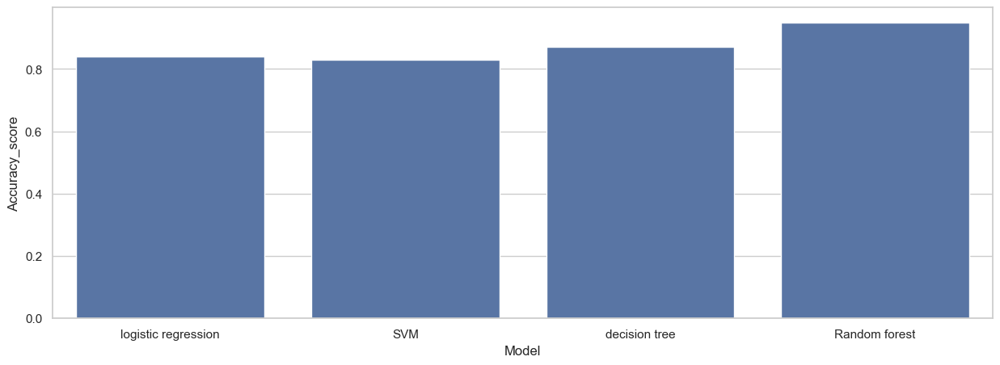

In [40]:
plt.figure(figsize=(15,5))
sns.set(style='whitegrid')
ax=sns.barplot(x='Model',y='Accuracy_score',data=model_report)

In [43]:
# save the model to disk
import pickle

filename = 'finalized_model.model'
pickle.dump(RFC, open(filename,'wb'))

In [44]:
# Load the model from disk
import pickle

filename = 'finalized_model.model'

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(x_test, y_test)
print(result)

# predict
#print(loaded_model.predict
#print(loaded_model.predict(x_test,y_test))

0.9333333333333333


* ## Analysis :
The data is supervised and categorical. The predictor variables are ordinal and a few among them are nominal. The target variable 'Performance Rating' is ordinal.

To analyze the data, various data processing techniques like Label Encoding and Standardization is used.

Correlation Coeffecient is used to interpret the relationship between variables.

The most important features selected are Department, Job Role, Environment Satisfaction, Last Salary Hike Percent, Work Life Balance, Experience Years At This Company, Experience Years In Current Role, Years Since Last Promotion, Years With Current Manager.

For training the data and predicting the target, algorithms used are Logistic Regression, Support Vector Machine, Decision Tree, Random Forest, K-Nearest Neighbor and Artificial Neural Network.

A separate analysis of Department wise Performance is done as well.

* ## Results
Random Forest with GridSearchCV gives 94% accuracy.

The features that are positively correlated are Environment Satisfaction, Last Salary Hike Percent & Worklife Balance. This means that if these factors increases, Performance Rating will increase. On the other hand, the features that are negatively correlated are Years Since Last Promotion, Experience Years at this Company, Experience years in Current Role & Years with Current Manager. This means that if these factors increases, Performance Rating will go down.

The top 3 features effecting employee performances are: Employee Environment Satisfaction Employee Last Salary Hike Percent Years since last promotion

* Analysis and Insights
It is observed that the maximum accuracy is obtained when we used Random Forest with GridSearchCV which is 94%. Decision tree and Artificial neural networks also yielded an accuracy of 92.5%.

* Recommendation
We can conclude that the company should provide a better environment as it increases the performance drastically. The company should increase the salary of the employee from time to time and help them maintain a worklife balance. On the other hand, shuffling the manager from time to time will also affect performance.